In [12]:
import matplotlib.pyplot as plt
import numpy as np


WINDOW_SIZE = 20

class Position:    
    def __init__(self, x: float, y: float):
        self.x = x
        self.y = y

    def __call__(self, *args, **kwds):
        return (self.x, self.y)


class Circle:
    def __init__(self, x: float, y: float, radius: int, colour: str):
        self.pos = Position(x, y)
        self.radius = radius
        self.colour = colour
        self.obj = plt.Circle(self.pos, self.radius, color=colour)

    def update(self):
        pass

2


In [9]:
%matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Set up the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(-10, 10)  # X-axis boundary
ax.set_ylim(-10, 10)  # Y-axis boundary

# Create the moving circle
circle = plt.Circle((0, 0), 1, color='b')  # Circle centered at (0,0) with radius 1
ax.add_patch(circle)

# Current position of the circle
position = np.array([0.0, 0.0])

def update(frame):
    """ Smoothly moves the circle to a new random position. """
    global position

    # Generate a small random movement step
    move_x = np.random.uniform(-1, 1)  # Small step in X direction
    move_y = np.random.uniform(-1, 1)  # Small step in Y direction

    # Update position
    position += np.array([move_x, move_y])

    # Keep the circle inside the boundary
    position[0] = np.clip(position[0], -9, 9)
    position[1] = np.clip(position[1], -9, 9)

    # Move the circle
    circle.set_center(position)

    return circle

# Create an animation
ani = animation.FuncAnimation(fig, update, frames=200, interval=50, blit=True)
from IPython.display import HTML
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as patches
from IPython.display import HTML


class Position:    
    """ A simple class to store 2D position """
    def __init__(self, x: float, y: float):
        self.x = x
        self.y = y

    def __call__(self):
        return (self.x, self.y)

    def move(self, dx: float, dy: float):
        """ Move the position by dx and dy """
        self.x += dx
        self.y += dy


class Obj:
    """ A class representing a movable object (circle) """
    def __init__(self, ax: plt.Axes, x: float, y: float, radius: float, colour: str):
        self.pos = Position(x, y)  # Position object
        self.radius = radius
        self.colour = colour
        self.circle = patches.Circle(self.pos(), radius, color=colour)  # Create circle
        ax.add_patch(self.circle)  # Add to plot

    def update(self):
        """ Moves the object to a new random position within bounds """
        dx, dy = np.random.uniform(-1, 1), np.random.uniform(-1, 1)
        self.pos.move(dx, dy)  # Update position
        self.circle.set_center(self.pos())  # Move the circle


# Set up the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)

# Create an object
obj = Obj(ax, x=0, y=0, radius=1, colour="blue")

def animate(frame):
    """ Updates the object in each frame """
    obj.update()
    return obj.circle,

# Create animation
ani = animation.FuncAnimation(fig, animate, frames=200, interval=50, blit=True)

# Display animation in Jupyter Notebook
HTML(ani.to_jshtml())  # Use `ani.to_html5_video()` if needed


<IPython.core.display.Javascript object>

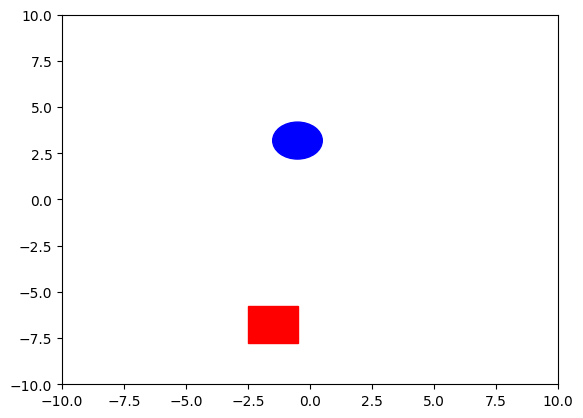

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as patches
from IPython.display import HTML


class Position:    
    """ A simple class to store 2D position """
    def __init__(self, x: float, y: float):
        self.x = x
        self.y = y

    def __call__(self):
        return (self.x, self.y)

    def move(self, dx: float, dy: float):
        """ Move the position by dx and dy """
        self.x += dx
        self.y += dy


class Obj:
    """ Parent class for moving objects (shapes) """
    def __init__(self, ax: plt.Axes, x: float, y: float, colour: str):
        self.pos = Position(x, y)  # Position object
        self.colour = colour
        self.shape = None  # To be defined in subclasses
        self.ax = ax

    def draw(self):
        """ Adds shape to the axis (to be implemented in child classes) """
        raise NotImplementedError

    def update(self):
        """ Moves the object to a new random position within bounds """
        dx, dy = np.random.uniform(-1, 1), np.random.uniform(-1, 1)
        self.pos.move(dx, dy)
        self.shape.set_center(self.pos())  # Move shape (for circles)
    

class Circle(Obj):
    """ Circle object that moves randomly """
    def __init__(self, ax: plt.Axes, x: float, y: float, radius: float, colour: str):
        super().__init__(ax, x, y, colour)
        self.radius = radius
        self.shape = patches.Circle(self.pos(), radius, color=colour)
        ax.add_patch(self.shape)


class Rectangle(Obj):
    """ Rectangle object that moves randomly """
    def __init__(self, ax: plt.Axes, x: float, y: float, width: float, height: float, colour: str):
        super().__init__(ax, x, y, colour)
        self.width = width
        self.height = height
        self.shape = patches.Rectangle(self.pos(), width, height, color=colour)
        ax.add_patch(self.shape)

    def update(self):
        """ Moves the rectangle and updates its position """
        dx, dy = np.random.uniform(-1, 1), np.random.uniform(-1, 1)
        self.pos.move(dx, dy)
        self.shape.set_xy(self.pos())  # Move shape (for rectangles)


# Set up the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)

# Create multiple objects
circle = Circle(ax, x=0, y=0, radius=1, colour="blue")
rect = Rectangle(ax, x=-5, y=-5, width=2, height=2, colour="red")

objects = [circle, rect]  # Store all objects in a list

def animate(frame):
    """ Updates all objects in each frame """
    for obj in objects:
        obj.update()
    return [obj.shape for obj in objects]

# Create animation
ani = animation.FuncAnimation(fig, animate, frames=200, interval=50, blit=True)

# Display animation in Jupyter Notebook
HTML(ani.to_jshtml())

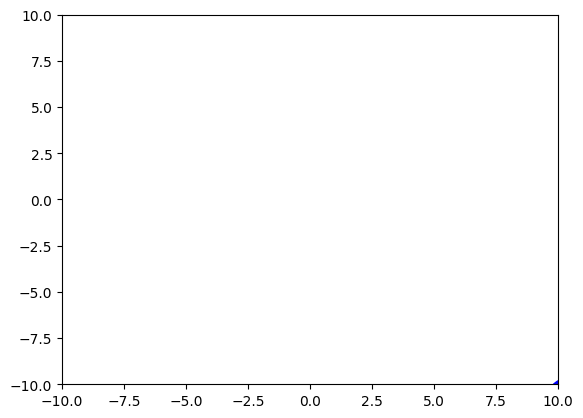

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as patches
from IPython.display import HTML


class Position:    
    """ A simple class to store 2D position """
    def __init__(self, x: float, y: float):
        self.x = x
        self.y = y

    def __call__(self):
        return (self.x, self.y)

    def move(self, dx: float, dy: float):
        """ Move the position by dx and dy """
        self.x += dx
        self.y += dy


class Obj:
    """ Parent class for moving objects (shapes) """
    def __init__(self, x: float, y: float, colour: str):
        self.pos = Position(x, y)  # Position object
        self.colour = colour
        self.shape = None  # To be defined in subclasses

    def draw(self, ax):
        """ Adds shape to the axis (to be implemented in child classes) """
        raise NotImplementedError

    def update(self):
        """ Moves the object to a new random position within bounds """
        dx, dy = np.random.uniform(-1, 1), np.random.uniform(-1, 1)
        self.pos.move(dx, dy)
        self.shape.set_center(self.pos())  # Move shape (for circles)
    

class Circle(Obj):
    """ Circle object that moves randomly """
    def __init__(self, x: float, y: float, radius: float, colour: str):
        super().__init__(x, y, colour)
        self.radius = radius

    def draw(self, ax):
        """ Create and add circle shape to Axes """
        self.shape = patches.Circle(self.pos(), self.radius, color=self.colour)
        ax.add_patch(self.shape)


class Rectangle(Obj):
    """ Rectangle object that moves randomly """
    def __init__(self, x: float, y: float, width: float, height: float, colour: str):
        super().__init__(x, y, colour)
        self.width = width
        self.height = height

    def draw(self, ax):
        """ Create and add rectangle shape to Axes """
        self.shape = patches.Rectangle(self.pos(), self.width, self.height, color=self.colour)
        ax.add_patch(self.shape)

    def update(self):
        """ Moves the rectangle and updates its position """
        dx, dy = np.random.uniform(-1, 1), np.random.uniform(-1, 1)
        self.pos.move(dx, dy)
        self.shape.set_xy(self.pos())  # Move shape (for rectangles)


class GameObject:
    """ Manages all objects in the game """
    def __init__(self, ax):
        self.ax = ax
        self.objects = []

    def add_object(self, obj):
        """ Add an object to the game and draw it """
        obj.draw(self.ax)
        self.objects.append(obj)

    def update(self):
        """ Updates all objects in each frame """
        for obj in self.objects:
            obj.update()
        return [obj.shape for obj in self.objects]


# Set up the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)

# Create the game object manager
game = GameObject(ax)

# Create and add objects
game.add_object(Circle(x=0, y=0, radius=1, colour="blue"))
game.add_object(Rectangle(x=-5, y=-5, width=2, height=2, colour="red"))

def animate(frame):
    """ Updates all objects in each frame """
    return game.update()

# Create animation
ani = animation.FuncAnimation(fig, animate, frames=200, interval=50, blit=True)

# Display animation in Jupyter Notebook
HTML(ani.to_jshtml())
